### The mock kiDS images

/Users/apple/miniconda3/lib/python3.9/site-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)
An error occurred while trying to fetch models/GGL_UNet_diffusion_model: Error no file named diffusion_pytorch_model.safetensors found in directory models/GGL_UNet_diffusion_model.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


shape of the noise image: torch.Size([100, 4, 64, 64])
shape of the fore/back_image image: torch.Size([100, 1, 64, 64]) torch.Size([100, 1, 64, 64])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

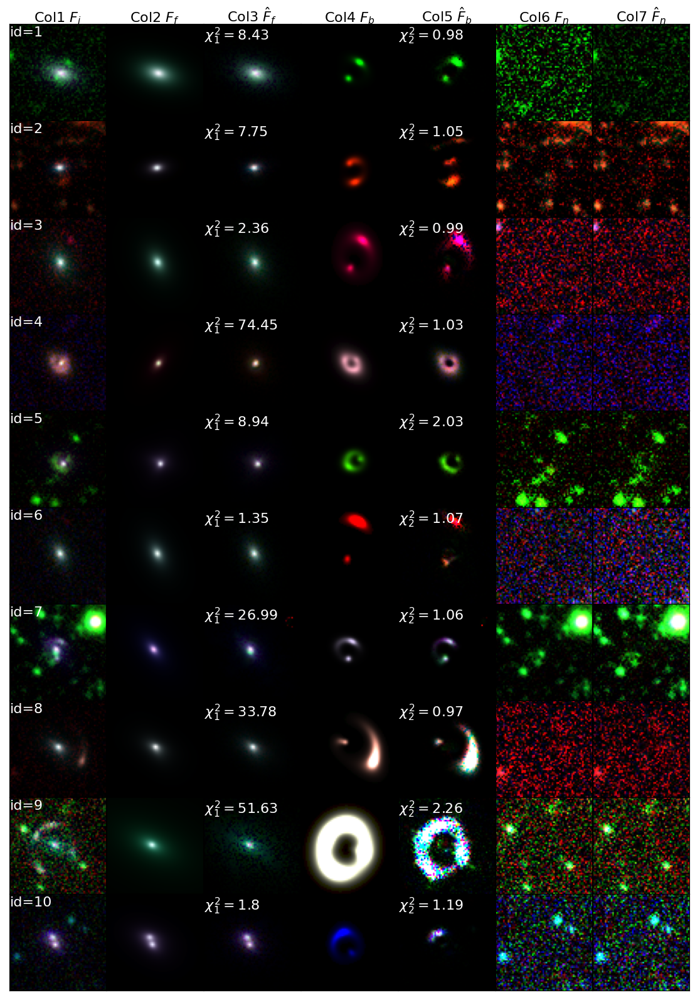

In [1]:
import diffusion_model, torch, plot_image
import matplotlib.pyplot as plt
import numpy as np
from astropy.table import Table

ggl_unet = diffusion_model.GGL_UNet()
ggl_unet.cfg['train_set'] = 'color_images.fits'
ggl_unet.Init()
ggl_unet.load_training_data(frac=0)
ggl_unet.pred_mock([0, 10], mode='def', timestep=10, load_model=True)
fname = 'results/GGL_UNet_diffusion_model_pred_mock_def.fits'
data = Table.read(fname)
plot_image.display_mock_image(data[0:10])

### The KiDS candidates

An error occurred while trying to fetch models/GGL_UNet_diffusion_model: Error no file named diffusion_pytorch_model.safetensors found in directory models/GGL_UNet_diffusion_model.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


shape of the noise image: torch.Size([100, 4, 64, 64])
shape of the fore/back_image image: torch.Size([100, 1, 64, 64]) torch.Size([100, 1, 64, 64])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

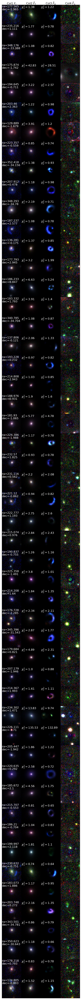

In [4]:
from astropy.table import hstack
import diffusion_model, torch, plot_image
ggl_unet = diffusion_model.GGL_UNet()
ggl_unet.cfg['train_set'] = 'color_images.fits'
ggl_unet.Init()
ggl_unet.load_training_data(frac=0)

data_lens = Table.read('results/kids_lens.fits')
color_images, weigh_image, RA, DEC = data_lens['image'], data_lens['weight'], data_lens['RA'], data_lens['DEC']

ggl_unet.pred_real(color_images, weight=weigh_image, RA=RA, DEC=DEC, timestep=25, load_model=True, save_name='pred_real_lens')
fname = 'results/GGL_UNet_diffusion_model_pred_real_lens.fits'
data = Table.read(fname)
plot_image.display_real_image(data[0:])